<a href="https://colab.research.google.com/github/abigailibarrola/data301-figure-skating/blob/master/DATA_301_Final_Project_Data_Exploration_Abigail_Ibarrola.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Exploration: Analyzing Scoring and Element Trends in a Decade of Senior-Level Singles Figure Skating

For a judged sport like figure skating, there is always a lot of controversy and discourse among fans and ethusiasts on how judges conduct their scores. Many argue against the validity of figure skating as a sport due to its subjective nature and the influences of judges' biases.

With the "quad revolution" in the Men Discipline beginning around the 2015-2016 season, and the ongoing emergence of this quad revolution in the Ladies Discipline, I am also curious about which elements are the most reliable and successful for skaters. Are the risks of these quadruple jumps worth it?

### Terminology
First, I should briefly explain some important terminology here, to get a better understanding of the data.



> **Base Value (BV)** - Each technical element (jumps, spins, etc.) has an assigned base value, depending on difficulty. The predefined value of a technical element.

> **Technical Element Score (TES)** - The score for technical elements. It roughly comprises of the sum of the BV and GOE (Grades of Execution) for all technical elements a skater performs.
Depending on how a skater executes an element, each judge assigns GOE point values to be added to the BV of the executed element. From 2004, the GOE ranged from -3 to +3, from 2018, it ranges from -5 to +5. 

> **Program Component Score (PCS)** - A separate set of scores based on skaters’ Skating Skills, Transitions, Performance, Composition, and Interpretation. There is no base value; each judge gives a score (roughly) ranging from 1 to 10 for each component. 

The total score for a program comprises of the sum of the TES and PCS for that program.




In [0]:
import pandas as pd
import numpy as np
from google.colab import drive
import matplotlib.pyplot as plt
from altair import *

In [2]:
# Read in datasets
drive.mount('/content/gdrive')
data_dir = "/content/gdrive/My Drive/DATA 301/"

df_skaters = pd.read_csv(data_dir + "skaters_data.csv")
df_jumps = pd.read_csv(data_dir + "jumps_data.csv")
df_spins = pd.read_csv(data_dir + "spins_data.csv")
df_pcs = pd.read_csv(data_dir + "pcs_data.csv")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Exploring Scoring Trends

At some points in this data exploration, I will be looking at six nations with large skating federations who have top-ranking skaters. These nations include Japan, Russia, the United States, Canada, Korea, and China. Because they have such a huge stronghold in figure skating, with many popular, top-ranking skaters, it's interesting to see data focusing on these nations.



In [3]:
top_nations = ["JPN", "RUS", "USA", "CAN", "KOR", "CHN"]
df_skaters.head()

,comp_id,event,skater_fullname,skater_nat,comp_rank,total_score,ded,bv,tes,pcs,j1_tes,j2_tes,j3_tes,j4_tes,j5_tes,j6_tes,j7_tes,j8_tes,j9_tes,j1_pcs,j2_pcs,j3_pcs,j4_pcs,j5_pcs,j6_pcs,j7_pcs,j8_pcs,j9_pcs,gender,j1_name,j2_name,j3_name,j4_name,j5_name,j6_name,j7_name,j8_name,j9_name,j1_nat,j2_nat,j3_nat,j4_nat,j5_nat,j6_nat,j7_nat,j8_nat,j9_nat,num_quads,num_triples,num_doubles,num_jump_errors,num_spin_errors,date
0,WC_1011,LADIES_SP,Yuna KIM,KOR,1,65.91,0.0,28.5,32.97,32.94,35.0,32.1,33.8,33.3,35.2,32.3,32.8,33.7,31.1,33.4,33.0,33.0,34.8,36.2,31.4,32.8,31.4,31.6,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,0,0,2011-04-25
1,WC_1011,LADIES_SP,Miki ANDO,JPN,2,65.58,0.0,28.7,34.20,31.38,33.8,33.8,35.5,35.5,33.6,33.1,34.8,34.3,33.1,31.0,32.2,32.6,31.8,30.6,31.4,30.6,31.6,30.6,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,0,0,2011-04-25
2,WC_1011,LADIES_SP,Ksenia MAKAROVA,RUS,3,61.62,0.0,28.8,32.53,29.09,33.2,33.2,32.7,31.0,32.7,31.5,33.9,32.0,31.7,30.4,30.2,28.8,28.6,28.6,30.4,29.0,27.2,28.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,3,1,0,0,2011-04-25
3,WC_1011,LADIES_SP,Alissa CZISNY,USA,4,61.47,0.0,27.7,31.33,30.14,31.2,31.9,32.5,33.2,31.5,30.3,29.3,31.2,31.3,29.4,30.6,32.0,31.6,31.4,29.0,27.6,30.2,29.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,1,0,2011-04-25
4,WC_1011,LADIES_SP,Alena LEONOVA,RUS,5,59.75,0.0,28.3,31.55,28.20,31.9,32.4,30.2,30.7,32.2,32.4,30.2,32.2,31.7,27.6,30.8,25.0,23.6,29.0,30.6,27.8,28.4,29.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,3,1,0,0,2011-04-25


## Relationship of TES and PCS

To start, let's graph the relationship of TES and PCS. Did the change to a +5 to -5 GOE scale (which occurred in the 2018-2019 season) from a +3 to -3 scale shift overall TES scores?

In [0]:
def comp_to_season(comp_id):
  return comp_id[-4:-2] + '-' + comp_id[-2:]

def season_to_era(season):
  if season == "18-19" or season == "19-20":
    return "After 2018-2019"
  else:
    return "Before 2018-2019"

df_skaters["season"] = df_skaters["comp_id"].map(comp_to_season)
df_skaters["Era"] = df_skaters["season"].map(season_to_era)
df_skaters["num_jumps"] = df_skaters["num_quads"] + df_skaters["num_triples"] + df_skaters["num_doubles"]
df_skaters_men = df_skaters[df_skaters["gender"] == "M"]
df_skaters_ladies = df_skaters[df_skaters["gender"] == "F"]

In [5]:
data_transformers.disable_max_rows()

# Plot Men short program data
df_skaters_men_sp = df_skaters_men[df_skaters_men.event.str.contains("SP")]

Chart(df_skaters_men_sp).mark_circle().encode(
    x="tes",
    y="pcs",
    color="Era"
)

alt.Chart(...)

In [6]:
df_skaters_men_fs = df_skaters_men[df_skaters_men.event.str.contains("FS")]

# Plot Men long program data
Chart(df_skaters_men_fs).mark_circle().encode(
    x="tes",
    y="pcs",
    color="Era"
)

alt.Chart(...)

It seems that for the Men discipline, the new GOE era does not seem to show a significant increase in TES scores. If anything, there appears to be a sight increase on the lower bound of PCS in the new era. Overall, it appears to follow the overall trend of TES vs PCS pretty consistently.

In [7]:
df_skaters_ladies_sp = df_skaters_ladies[df_skaters_ladies.event.str.contains("SP")]

# Plot Ladies short program data
Chart(df_skaters_ladies_sp).mark_circle().encode(
    x="tes",
    y="pcs",
    color="Era"
)

alt.Chart(...)

In [8]:
df_skaters_ladies_fs = df_skaters_ladies[df_skaters_ladies.event.str.contains("FS")]

# Plot Ladies long program data
Chart(df_skaters_ladies_fs).mark_circle().encode(
    x="tes",
    y="pcs",
    color="Era"
)

alt.Chart(...)

In the Ladies discipline, we see some outliers in the new GOE era, with several high TES scores. These correspond to new female skaters introducing quad jumps into their programs. It does show that these high TES programe don't always receive the highest PCS scores, since they start to deviate from the linear trend.

In [9]:
df_top_skaters = df_skaters.loc[df_skaters["skater_nat"].isin(top_nations)]
Chart(df_top_skaters).mark_circle().encode(
    x="tes",
    y="pcs",
    color="skater_nat",
    column="gender"
)

alt.Chart(...)

From these, we can see that the outliers in the ladies graph were by Russian female figure skaters.

## Effects of Nationality & Gender on Judge Scores

Throughout the decade, there has been a lot of changes made to BV's of elements, how GOE's and other score values are translated, and many other rule changes in the sport. There are also differences between how the Men and Ladies disciplines scores are scaled. These variances make it difficult to compare raw values because it's not always certain what it is affected by.

I decided to compare judge's point differences instead, meaning how much more or less is the judge's score from the skater's final score. This makes it relative the performance, and makes it easier to compare postive or negative scoring trends.

In [10]:
for i in range(1, 10):
  df_skaters["j%d_tes_diff" % i] = df_skaters["j%d_tes" % i] - df_skaters["tes"]
  df_skaters["j%d_pcs_diff" % i] = df_skaters["j%d_pcs" % i] - df_skaters["pcs"]

df_skaters.head()

,comp_id,event,skater_fullname,skater_nat,comp_rank,total_score,ded,bv,tes,pcs,j1_tes,j2_tes,j3_tes,j4_tes,j5_tes,j6_tes,j7_tes,j8_tes,j9_tes,j1_pcs,j2_pcs,j3_pcs,j4_pcs,j5_pcs,j6_pcs,j7_pcs,j8_pcs,j9_pcs,gender,j1_name,j2_name,j3_name,j4_name,j5_name,j6_name,j7_name,j8_name,j9_name,j1_nat,j2_nat,j3_nat,j4_nat,j5_nat,j6_nat,j7_nat,j8_nat,j9_nat,num_quads,num_triples,num_doubles,num_jump_errors,num_spin_errors,date,season,Era,num_jumps,j1_tes_diff,j1_pcs_diff,j2_tes_diff,j2_pcs_diff,j3_tes_diff,j3_pcs_diff,j4_tes_diff,j4_pcs_diff,j5_tes_diff,j5_pcs_diff,j6_tes_diff,j6_pcs_diff,j7_tes_diff,j7_pcs_diff,j8_tes_diff,j8_pcs_diff,j9_tes_diff,j9_pcs_diff
0,WC_1011,LADIES_SP,Yuna KIM,KOR,1,65.91,0.0,28.5,32.97,32.94,35.0,32.1,33.8,33.3,35.2,32.3,32.8,33.7,31.1,33.4,33.0,33.0,34.8,36.2,31.4,32.8,31.4,31.6,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,0,0,2011-04-25,10-11,Before 2018-2019,4,2.03,0.46,-0.87,0.06,0.83,0.06,0.33,1.86,2.23,3.26,-0.67,-1.54,-0.17,-0.14,0.73,-1.54,-1.87,-1.34
1,WC_1011,LADIES_SP,Miki ANDO,JPN,2,65.58,0.0,28.7,34.20,31.38,33.8,33.8,35.5,35.5,33.6,33.1,34.8,34.3,33.1,31.0,32.2,32.6,31.8,30.6,31.4,30.6,31.6,30.6,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,0,0,2011-04-25,10-11,Before 2018-2019,4,-0.40,-0.38,-0.40,0.82,1.30,1.22,1.30,0.42,-0.60,-0.78,-1.10,0.02,0.60,-0.78,0.10,0.22,-1.10,-0.78
2,WC_1011,LADIES_SP,Ksenia MAKAROVA,RUS,3,61.62,0.0,28.8,32.53,29.09,33.2,33.2,32.7,31.0,32.7,31.5,33.9,32.0,31.7,30.4,30.2,28.8,28.6,28.6,30.4,29.0,27.2,28.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,3,1,0,0,2011-04-25,10-11,Before 2018-2019,4,0.67,1.31,0.67,1.11,0.17,-0.29,-1.53,-0.49,0.17,-0.49,-1.03,1.31,1.37,-0.09,-0.53,-1.89,-0.83,-0.89
3,WC_1011,LADIES_SP,Alissa CZISNY,USA,4,61.47,0.0,27.7,31.33,30.14,31.2,31.9,32.5,33.2,31.5,30.3,29.3,31.2,31.3,29.4,30.6,32.0,31.6,31.4,29.0,27.6,30.2,29.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,2,2,1,0,2011-04-25,10-11,Before 2018-2019,4,-0.13,-0.74,0.57,0.46,1.17,1.86,1.87,1.46,0.17,1.26,-1.03,-1.14,-2.03,-2.54,-0.13,0.06,-0.03,-0.94
4,WC_1011,LADIES_SP,Alena LEONOVA,RUS,5,59.75,0.0,28.3,31.55,28.20,31.9,32.4,30.2,30.7,32.2,32.4,30.2,32.2,31.7,27.6,30.8,25.0,23.6,29.0,30.6,27.8,28.4,29.2,F,Prisca BINZ-MOSER,Igor FEDCHENKO,Saioa SANCHO,Georgi DIMKOV,Evgeni ROKHIN,Tarja RISTANEN,Stanislava SMIDOVA,Igor DOLGUSHIN,Deborah NOYES,SUI,UKR,ESP,ISU,UZB,FIN,CZE,RUS,AUS,0,3,1,0,0,2011-04-25,10-11,Before 2018-2019,4,0.35,-0.60,0.85,2.60,-1.35,-3.20,-0.85,-4.60,0.65,0.80,0.85,2.40,-1.35,-0.40,0.65,0.20,0.15,1.00


### Preparing and reorganizing data

In order to analyze these judge scoring trends, I need to rearrange data so that each observation is a single judge's score data.

Again, I only used data beginning from the 2016-2017 season, since that is when judges' scores are associated with their identities. 

In [11]:
known_judge_nat = df_skaters[df_skaters.comp_id.str.contains("1617") |
                             df_skaters.comp_id.str.contains("1718") |
                             df_skaters.comp_id.str.contains("1819") |
                             df_skaters.comp_id.str.contains("1920")]
known_judge_nat.reset_index(inplace=True, drop=True)
known_judge_nat.head()

,comp_id,event,skater_fullname,skater_nat,comp_rank,total_score,ded,bv,tes,pcs,j1_tes,j2_tes,j3_tes,j4_tes,j5_tes,j6_tes,j7_tes,j8_tes,j9_tes,j1_pcs,j2_pcs,j3_pcs,j4_pcs,j5_pcs,j6_pcs,j7_pcs,j8_pcs,j9_pcs,gender,j1_name,j2_name,j3_name,j4_name,j5_name,j6_name,j7_name,j8_name,j9_name,j1_nat,j2_nat,j3_nat,j4_nat,j5_nat,j6_nat,j7_nat,j8_nat,j9_nat,num_quads,num_triples,num_doubles,num_jump_errors,num_spin_errors,date,season,Era,num_jumps,j1_tes_diff,j1_pcs_diff,j2_tes_diff,j2_pcs_diff,j3_tes_diff,j3_pcs_diff,j4_tes_diff,j4_pcs_diff,j5_tes_diff,j5_pcs_diff,j6_tes_diff,j6_pcs_diff,j7_tes_diff,j7_pcs_diff,j8_tes_diff,j8_pcs_diff,j9_tes_diff,j9_pcs_diff
0,WC_1617,LADIES_SP,Evgenia MEDVEDEVA,RUS,1,79.01,0.0,33.10,42.10,36.91,40.30,43.20,41.30,42.00,42.70,42.20,42.00,42.00,43.20,37.0,37.2,35.6,36.6,36.6,38.4,36.2,36.6,38.0,F,Elisabeth LOUESDON,Leanna CARON,Richard GRAINGE,Mona ADOLFSEN,Sakae YAMAMOTO,Edith SCHILLER,Jung-Sue LEE,Jana BAUDYSOVA,Christiane MILES,FRA,CAN,GBR,NOR,JPN,AUT,KOR,CZE,SUI,0,3,1,0,0,2017-03-29,16-17,Before 2018-2019,4,-1.80,0.09,1.10,0.29,-0.80,-1.31,-0.10,-0.31,0.60,-0.31,0.10,1.49,-0.10,-0.71,-0.10,-0.31,1.10,1.09
1,WC_1617,LADIES_SP,Kaetlyn OSMOND,CAN,2,75.98,0.0,32.53,41.23,34.75,39.53,43.63,40.73,41.43,42.13,40.23,41.43,40.73,40.93,32.8,37.2,31.0,34.6,34.8,36.4,34.4,34.4,36.0,F,Elisabeth LOUESDON,Leanna CARON,Richard GRAINGE,Mona ADOLFSEN,Sakae YAMAMOTO,Edith SCHILLER,Jung-Sue LEE,Jana BAUDYSOVA,Christiane MILES,FRA,CAN,GBR,NOR,JPN,AUT,KOR,CZE,SUI,0,3,1,0,0,2017-03-29,16-17,Before 2018-2019,4,-1.70,-1.95,2.40,2.45,-0.50,-3.75,0.20,-0.15,0.90,0.05,-1.00,1.65,0.20,-0.35,-0.50,-0.35,-0.30,1.25
2,WC_1617,LADIES_SP,Gabrielle DALEMAN,CAN,3,72.19,0.0,31.83,39.19,33.00,38.33,40.23,38.83,37.63,39.03,39.83,39.03,38.83,39.03,32.2,32.8,33.6,33.6,32.2,35.6,31.2,32.6,34.0,F,Elisabeth LOUESDON,Leanna CARON,Richard GRAINGE,Mona ADOLFSEN,Sakae YAMAMOTO,Edith SCHILLER,Jung-Sue LEE,Jana BAUDYSOVA,Christiane MILES,FRA,CAN,GBR,NOR,JPN,AUT,KOR,CZE,SUI,0,3,1,0,0,2017-03-29,16-17,Before 2018-2019,4,-0.86,-0.80,1.04,-0.20,-0.36,0.60,-1.56,0.60,-0.16,-0.80,0.64,2.60,-0.16,-1.80,-0.36,-0.40,-0.16,1.00
3,WC_1617,LADIES_SP,Anna POGORILAYA,RUS,4,71.52,0.0,32.84,37.21,34.31,36.24,36.74,36.94,36.24,37.44,36.04,39.14,38.64,37.94,33.8,32.8,33.0,35.0,36.2,35.2,33.6,34.6,34.8,F,Elisabeth LOUESDON,Leanna CARON,Richard GRAINGE,Mona ADOLFSEN,Sakae YAMAMOTO,Edith SCHILLER,Jung-Sue LEE,Jana BAUDYSOVA,Christiane MILES,FRA,CAN,GBR,NOR,JPN,AUT,KOR,CZE,SUI,0,3,1,0,0,2017-03-29,16-17,Before 2018-2019,4,-0.97,-0.51,-0.47,-1.51,-0.27,-1.31,-0.97,0.69,0.23,1.89,-1.17,0.89,1.93,-0.71,1.43,0.29,0.73,0.49
4,WC_1617,LADIES_SP,Karen CHEN,USA,5,69.98,0.0,32.24,38.35,31.63,38.84,38.84,37.84,38.14,40.04,39.54,37.64,37.44,36.64,30.4,31.8,31.2,32.6,33.6,34.2,30.4,31.4,28.2,F,Elisabeth LOUESDON,Leanna CARON,Richard GRAINGE,Mona ADOLFSEN,Sakae YAMAMOTO,Edith SCHILLER,Jung-Sue LEE,Jana BAUDYSOVA,Christiane MILES,FRA,CAN,GBR,NOR,JPN,AUT,KOR,CZE,SUI,0,3,1,0,0,2017-03-29,16-17,Before 2018-2019,4,0.49,-1.23,0.49,0.17,-0.51,-0.43,-0.21,0.97,1.69,1.97,1.19,2.57,-0.71,-1.23,-0.91,-0.23,-1.71,-3.43


In [12]:
cols = ["comp_id", "skater_nat", "gender"]
df_single_judge = (known_judge_nat[cols + ["j1_name", "j1_nat", "j1_tes_diff", "j1_pcs_diff"]].copy()
      .rename(columns={"j1_name" : "judge_name",
                       "j1_nat" : "judge_nat", 
                       "j1_tes_diff" : "judge_tes_diff", 
                       "j1_pcs_diff" : "judge_pcs_diff"}))

for i in range(2, 10):
  j = "j%d" % i
  single_judge = (known_judge_nat[cols + [j + "_name", j + "_nat", j + "_tes_diff", j + "_pcs_diff"]]
                  .copy()
                  .rename(columns={j + "_name" : "judge_name",
                                   j + "_nat" : "judge_nat", 
                                   j + "_tes_diff" : "judge_tes_diff", 
                                   j + "_pcs_diff" : "judge_pcs_diff"}))
  df_single_judge = pd.concat([df_single_judge, single_judge])

df_single_judge

,comp_id,skater_nat,gender,judge_name,judge_nat,judge_tes_diff,judge_pcs_diff
0,WC_1617,RUS,F,Elisabeth LOUESDON,FRA,-1.80,0.09
1,WC_1617,CAN,F,Elisabeth LOUESDON,FRA,-1.70,-1.95
2,WC_1617,CAN,F,Elisabeth LOUESDON,FRA,-0.86,-0.80
3,WC_1617,RUS,F,Elisabeth LOUESDON,FRA,-0.97,-0.51
4,WC_1617,USA,F,Elisabeth LOUESDON,FRA,0.49,-1.23
...,...,...,...,...,...,...,...
2522,GPCAN_1920,CAN,M,Agita ABELE,LAT,1.12,1.22
2523,GPCAN_1920,AUS,M,Agita ABELE,LAT,2.11,0.94
2524,GPCAN_1920,MAS,M,Agita ABELE,LAT,-1.01,-1.78
2525,GPCAN_1920,GER,M,Agita ABELE,LAT,-0.35,-0.52


There are also a few scores that are from empty judge slots (a TES / PCS score of 0 should not be possible), so I removed them.

In [13]:
no_scores = known_judge_nat.loc[known_judge_nat["j9_tes"] == 0]
no_scores.sort_values(by="j9_tes_diff", ascending=False).head(2)

,comp_id,event,skater_fullname,skater_nat,comp_rank,total_score,ded,bv,tes,pcs,j1_tes,j2_tes,j3_tes,j4_tes,j5_tes,j6_tes,j7_tes,j8_tes,j9_tes,j1_pcs,j2_pcs,j3_pcs,j4_pcs,j5_pcs,j6_pcs,j7_pcs,j8_pcs,j9_pcs,gender,j1_name,j2_name,j3_name,j4_name,j5_name,j6_name,j7_name,j8_name,j9_name,j1_nat,j2_nat,j3_nat,j4_nat,j5_nat,j6_nat,j7_nat,j8_nat,j9_nat,num_quads,num_triples,num_doubles,num_jump_errors,num_spin_errors,date,season,Era,num_jumps,j1_tes_diff,j1_pcs_diff,j2_tes_diff,j2_pcs_diff,j3_tes_diff,j3_pcs_diff,j4_tes_diff,j4_pcs_diff,j5_tes_diff,j5_pcs_diff,j6_tes_diff,j6_pcs_diff,j7_tes_diff,j7_pcs_diff,j8_tes_diff,j8_pcs_diff,j9_tes_diff,j9_pcs_diff
2029,4CC_1920,LADIES_SP,Aiza MAMBEKOVA,KAZ,21,37.91,0.0,18.03,16.68,21.23,17.52,17.08,16.41,16.38,14.78,17.34,16.08,17.89,0.0,21.8,22.0,21.2,21.8,21.0,18.0,19.6,23.0,0.0,F,Sung-Hee KOH,Angelique CLYDE-SMITH,Todd BROMLEY,Ayumi KOZUKA,Ko-Man TING,Ariadna MORONES NEGRETE,Yu WANG,Yuriy GUSKOV,Beth CRANE,KOR,AUS,USA,JPN,TWN,MEX,CHN,KAZ,CAN,0,2,2,4,0,2020-02-04,19-20,After 2018-2019,4,0.84,0.57,0.40,0.77,-0.27,-0.03,-0.30,0.57,-1.90,-0.23,0.66,-3.23,-0.60,-1.63,1.21,1.77,-16.68,-21.23
2028,4CC_1920,LADIES_SP,Amy LIN,TPE,20,40.29,0.0,20.47,18.43,21.86,19.31,20.82,19.53,17.95,17.72,17.68,17.85,17.86,0.0,22.6,27.6,21.0,21.0,23.2,20.0,20.4,23.0,0.0,F,Sung-Hee KOH,Angelique CLYDE-SMITH,Todd BROMLEY,Ayumi KOZUKA,Ko-Man TING,Ariadna MORONES NEGRETE,Yu WANG,Yuriy GUSKOV,Beth CRANE,KOR,AUS,USA,JPN,TWN,MEX,CHN,KAZ,CAN,0,3,1,4,0,2020-02-04,19-20,After 2018-2019,4,0.88,0.74,2.39,5.74,1.10,-0.86,-0.48,-0.86,-0.71,1.34,-0.75,-1.86,-0.58,-1.46,-0.57,1.14,-18.43,-21.86


In [0]:
# Remove judge data with zero as scores
df_single_judge = df_single_judge.loc[df_single_judge["judge_tes_diff"] > -15]

### Average Overall TES / PCS per Judge Nationality

In [0]:
df_judge_tes_diff = pd.DataFrame(df_single_judge.groupby("judge_nat")["judge_tes_diff"].mean())
df_judge_tes_diff.reset_index(inplace=True)
df_judge_tes_diff.sort_values(by=["judge_tes_diff"], inplace=True)

df_judge_pcs_diff = pd.DataFrame(df_single_judge.groupby("judge_nat")["judge_pcs_diff"].mean())
df_judge_pcs_diff.reset_index(inplace=True)
df_judge_pcs_diff.sort_values(by=["judge_pcs_diff"], inplace=True)

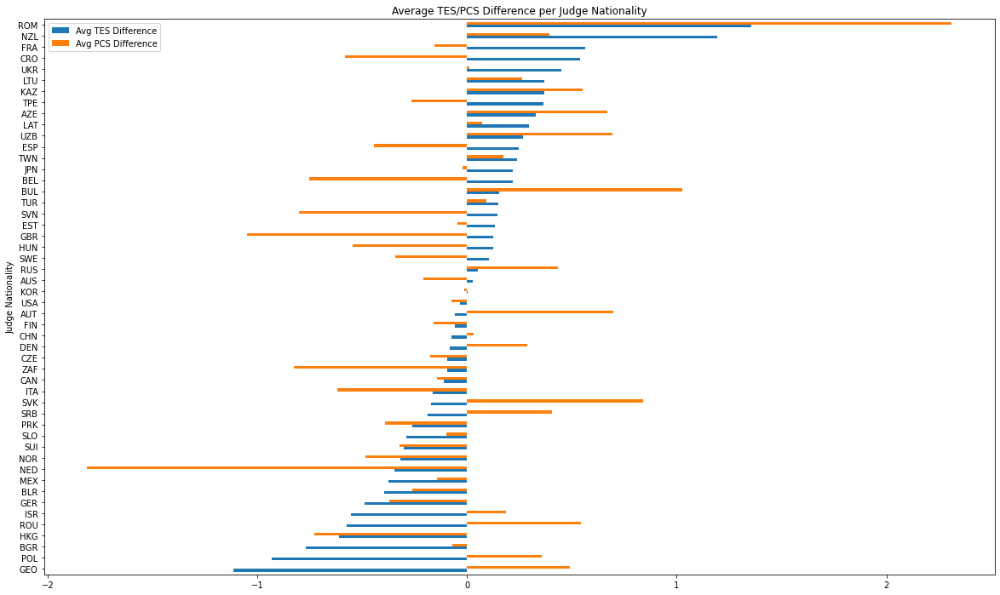

In [17]:
combined_diff = df_judge_tes_diff.merge(df_judge_pcs_diff, on="judge_nat")
combined_diff.rename(columns={"judge_nat" : "Judge Nationality", 
                                  "judge_pcs_diff" : "Avg PCS Difference", 
                                  "judge_tes_diff" : "Avg TES Difference"}, inplace=True)
combined_diff.set_index("Judge Nationality", inplace=True)
combined_diff.plot.barh(rot=0,
                            title="Average TES/PCS Difference per Judge Nationality",
                            figsize=(20, 12))

It appears that smaller skating federations like Romania, New Zealand, and Georgia tend to have more egregious scoring differences, whether it be more generous or more strict.

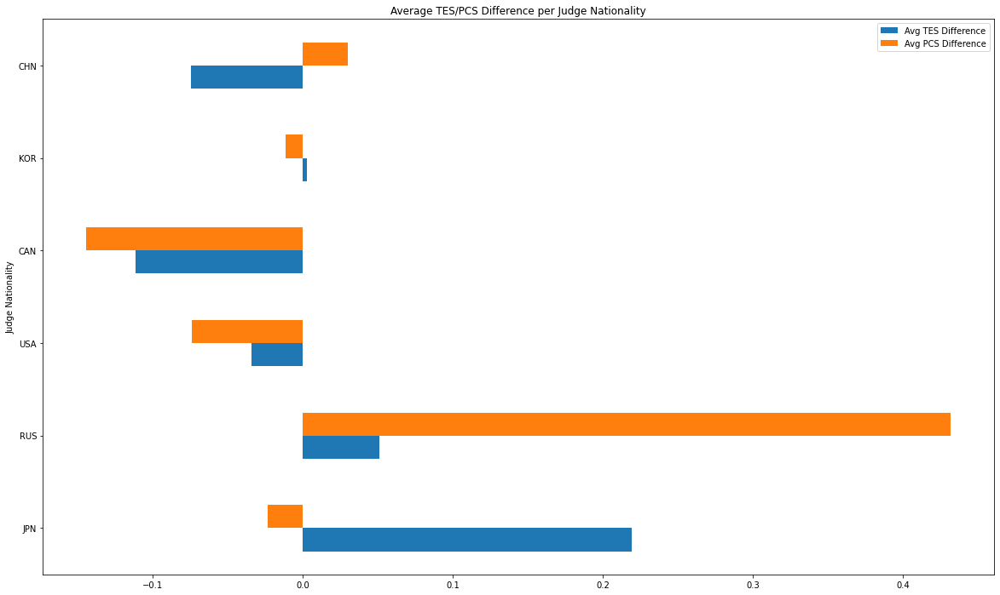

In [18]:
combined_diff.loc[top_nations].plot.barh(rot=0,
                            title="Average TES/PCS Difference per Judge Nationality",
                            figsize=(20, 12))

In [19]:
combined_diff.loc[top_nations]

,Avg TES Difference,Avg PCS Difference
Judge Nationality,,
JPN,0.219320,-0.023024
RUS,0.051458,0.431733
USA,-0.033923,-0.073512
CAN,-0.111378,-0.144227
KOR,0.003189,-0.011126
CHN,-0.074543,0.030244


As for the top skating nations, overall, their average TES and PCS differences are pretty minute, with most ranging from -0.1 to 0.2 points off from the final scores. It looks like that Russia tends to score skaters more generously overall though.

### Average TES / PCS Difference by Gender per Judge Nationality

Do judges favor a certain gender?



[Text(0, 0.5, 'Judge Nationality'), Text(0.5, 0, 'Average TES Difference')]

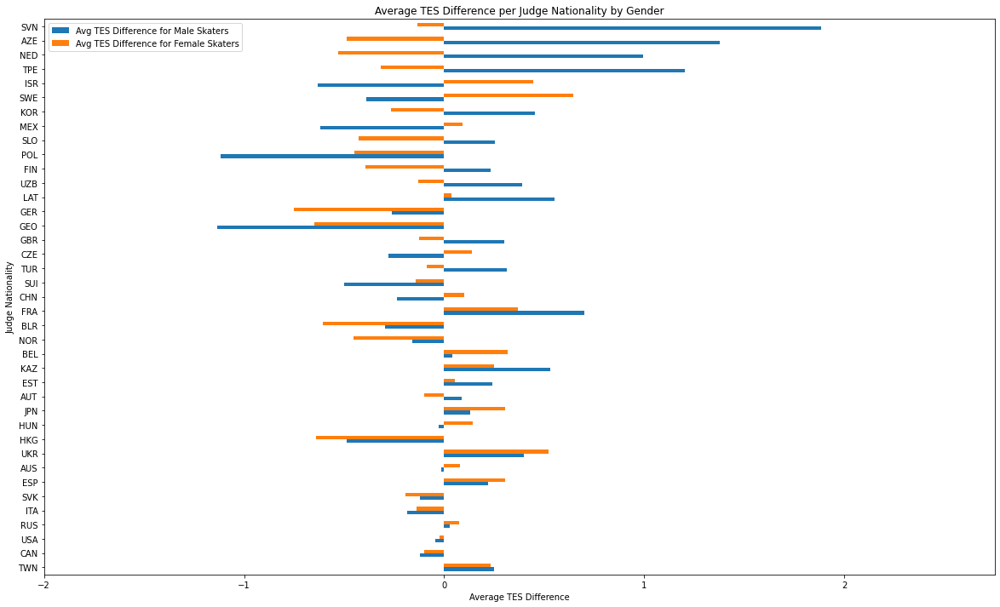

In [20]:
avg_tes_gender = df_single_judge.groupby(["gender", "judge_nat"])["judge_tes_diff"].mean()
df_avg_tes_gender = avg_tes_gender["M"].to_frame()
df_avg_tes_gender.rename(columns={"judge_tes_diff" : "Avg TES Difference for Male Skaters"},
                    inplace=True)
df_avg_tes_f = avg_tes_gender["F"].to_frame()
df_avg_tes_gender["Avg TES Difference for Female Skaters"] = df_avg_tes_f["judge_tes_diff"]
df_avg_tes_gender.dropna(inplace=True)
df_avg_tes_gender["gender_diff"] = (df_avg_tes_gender["Avg TES Difference for Female Skaters"] - 
                                        df_avg_tes_gender["Avg TES Difference for Male Skaters"]).abs()
df_avg_tes_gender.sort_values(by="gender_diff", inplace=True)
(df_avg_tes_gender.drop(columns="gender_diff")
.plot.barh(rot=0,
           title="Average TES Difference per Judge Nationality by Gender",
           figsize=(20, 12),
           xlim=(-2, 2.75))
.set(xlabel="Average TES Difference", ylabel="Judge Nationality"))

In [274]:
df_avg_tes_gender.sort_values(by="gender_diff").head(5)

,Avg TES Difference for Male Skaters,Avg TES Difference for Female Skaters,gender_diff
judge_nat,,,
TWN,0.248862,0.233099,0.015762
CAN,-0.120102,-0.100770,0.019332
USA,-0.045967,-0.022614,0.023353
RUS,0.028318,0.075307,0.046988
ITA,-0.186353,-0.139068,0.047285


In [280]:
df_avg_tes_gender.sort_values(by="gender_diff", ascending=False).head(5)

,Avg TES Difference for Male Skaters,Avg TES Difference for Female Skaters,gender_diff
judge_nat,,,
SVN,1.884167,-0.135743,2.019910
AZE,1.376071,-0.486759,1.862831
NED,0.994583,-0.530113,1.524696
TPE,1.201143,-0.317674,1.518817
ISR,-0.631764,0.444783,1.076546


Some nations have some really stark differences of TES according to gender. The top four nations with the largest gender differences seem to favor male skaters more than female skaters. Meanwhile, the lowest gender difference comprises of some of the top skating nations.

[Text(0, 0.5, 'Judge Nationality'), Text(0.5, 0, 'Average PCS Difference')]

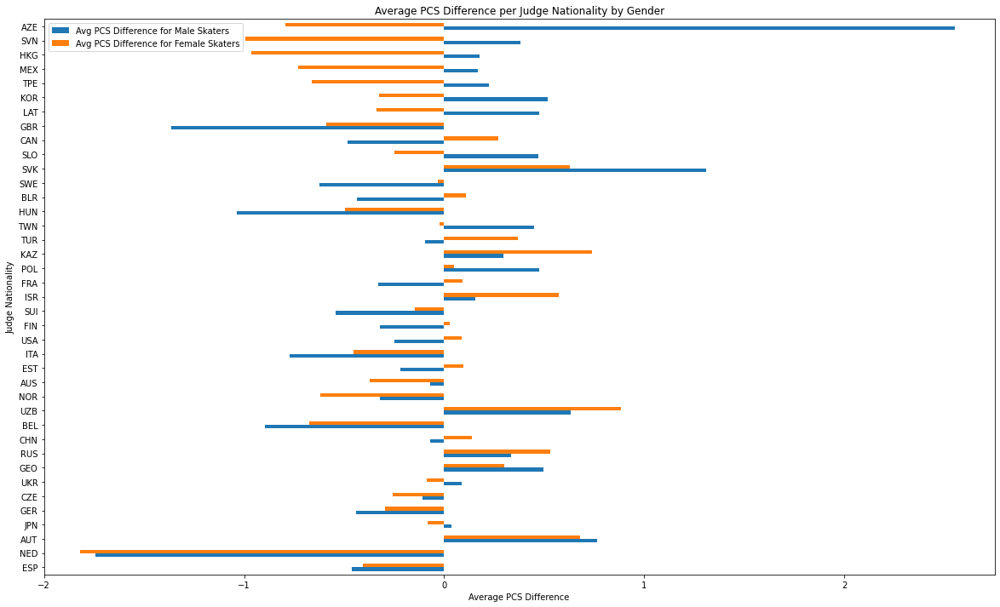

In [21]:
avg_pcs_gender = df_single_judge.groupby(["gender", "judge_nat"])["judge_pcs_diff"].mean()
df_avg_pcs_gender = avg_pcs_gender["M"].to_frame()
df_avg_pcs_gender.rename(columns={"judge_pcs_diff" : "Avg PCS Difference for Male Skaters"},
                    inplace=True)
df_avg_pcs_f = avg_pcs_gender["F"].to_frame()
df_avg_pcs_gender["Avg PCS Difference for Female Skaters"] = df_avg_pcs_f["judge_pcs_diff"]
df_avg_pcs_gender.dropna(inplace=True)
df_avg_pcs_gender["gender_diff"] = (df_avg_pcs_gender["Avg PCS Difference for Female Skaters"] - 
                                        df_avg_pcs_gender["Avg PCS Difference for Male Skaters"]).abs()
df_avg_pcs_gender.sort_values(by="gender_diff", inplace=True)
(df_avg_pcs_gender.drop(columns="gender_diff")
.plot.barh(rot=0,
           title="Average PCS Difference per Judge Nationality by Gender",
           figsize=(20, 12),
           xlim=(-2, 2.75))
.set(xlabel="Average PCS Difference", ylabel="Judge Nationality"))

In [277]:
df_avg_pcs_gender.sort_values(by="gender_diff").head(5)

,Avg PCS Difference for Male Skaters,Avg PCS Difference for Female Skaters,gender_diff
judge_nat,,,
ESP,-0.461168,-0.404400,0.056768
NED,-1.742500,-1.820565,0.078065
AUT,0.765857,0.678125,0.087732
JPN,0.036932,-0.080845,0.117777
GER,-0.438871,-0.295884,0.142987


In [279]:
df_avg_pcs_gender.sort_values(by="gender_diff", ascending=False).head(5)

,Avg PCS Difference for Male Skaters,Avg PCS Difference for Female Skaters,gender_diff
judge_nat,,,
AZE,2.550833,-0.792963,3.343796
SVN,0.382500,-0.994122,1.376622
HKG,0.176667,-0.964835,1.141502
MEX,0.166732,-0.729817,0.896548
TPE,0.223429,-0.660233,0.883661


The PCS scores differences seem to be even more egregious, with the top seven nations with the largest gender score differences being more strict / harsh to female skaters.

[Text(0, 0.5, 'Judge Nationality'), Text(0.5, 0, 'Average TES Difference')]

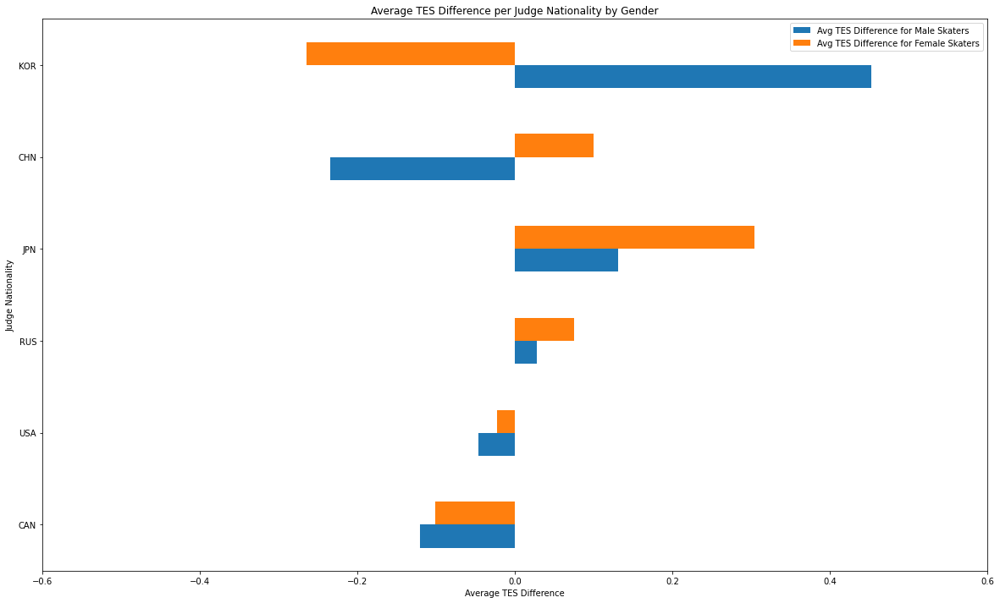

In [253]:
(df_avg_tes_gender.loc[top_nations]
 .sort_values(by="gender_diff")
 .drop(columns="gender_diff")
 .plot.barh(rot=0,
            title="Average TES Difference per Judge Nationality by Gender",
            figsize=(20, 12),
            xlim=(-0.6, 0.6))
 .set(xlabel="Average TES Difference", ylabel="Judge Nationality"))

[Text(0, 0.5, 'Judge Nationality'), Text(0.5, 0, 'Average PCS Difference')]

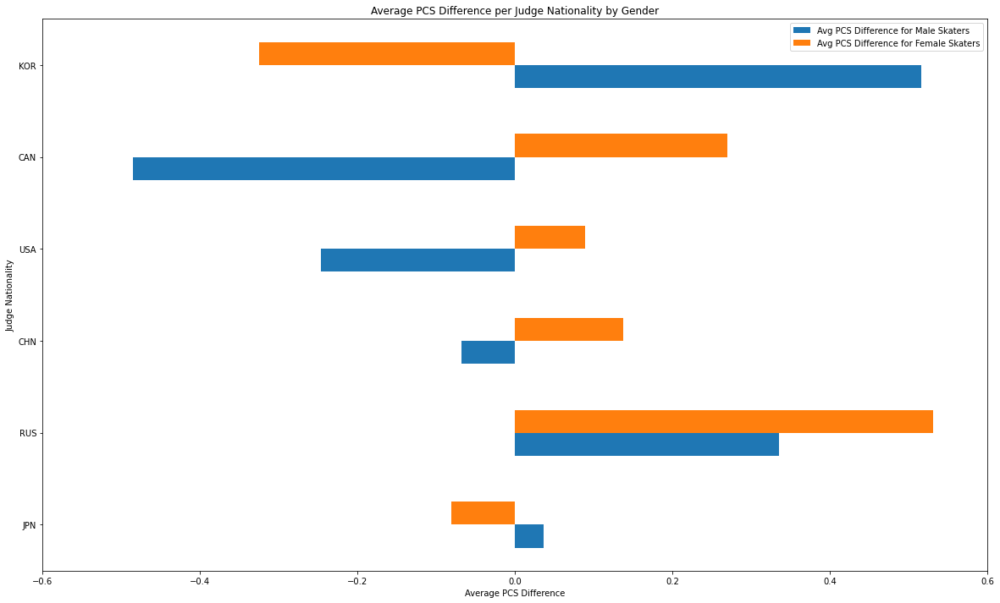

In [254]:
(df_avg_pcs_gender.loc[top_nations]
 .sort_values(by="gender_diff")
 .drop(columns="gender_diff")
 .plot.barh(rot=0,
            title="Average PCS Difference per Judge Nationality by Gender",
            figsize=(20, 12),
            xlim=(-0.6, 0.6))
 .set(xlabel="Average PCS Difference", ylabel="Judge Nationality"))

For the top skating nations, the gender differences appear to be minute. Korea does appear to consistently favor male skaters in both average TES and PCS scores.

### Average TES / PCS Difference by Skater Nationality per Judge Nationality

How do judges score skaters from the top skating nations?

[Text(0, 0.5, 'Avg TES Difference'), Text(0.5, 0, 'Judge Nationality')]

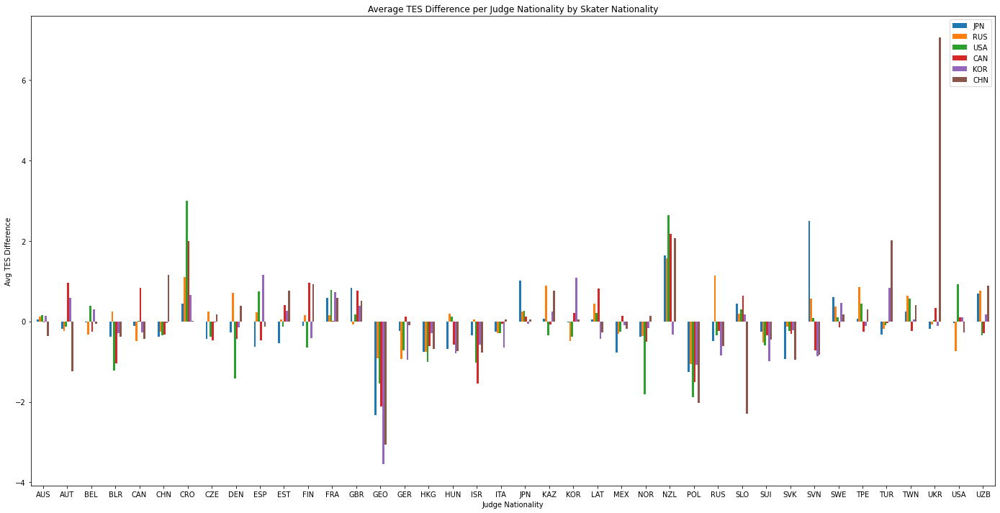

In [23]:
avg_tes_nat = df_single_judge.groupby(["skater_nat", "judge_nat"])["judge_tes_diff"].mean()
df_avg_tes_nat = avg_tes_nat["JPN"].to_frame()
df_avg_tes_nat.rename(columns={"judge_tes_diff" : "JPN"}, inplace=True)

for nat in ["RUS", "USA", "CAN", "KOR", "CHN"]:
  df_avg_tes_nat[nat] = avg_tes_nat[nat]

df_avg_tes_nat.dropna(inplace=True)
df_avg_tes_nat
(df_avg_tes_nat.plot.bar(rot=0, figsize=(24, 12), title="Average TES Difference per Judge Nationality by Skater Nationality")
.set(xlabel="Judge Nationality", ylabel="Avg TES Difference"))

[Text(0, 0.5, 'Avg PCS Difference'), Text(0.5, 0, 'Judge Nationality')]

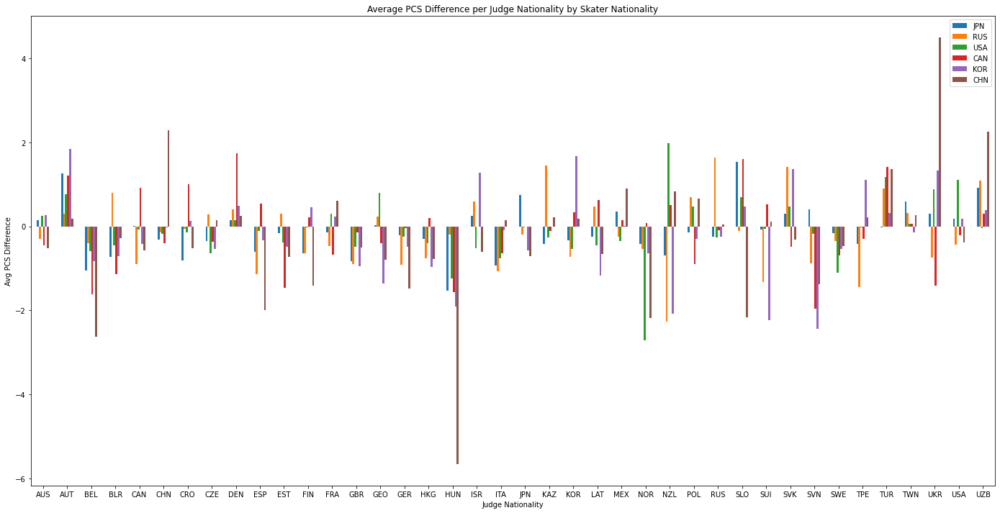

In [24]:
avg_pcs_nat = df_single_judge.groupby(["skater_nat", "judge_nat"])["judge_pcs_diff"].mean()
df_avg_pcs_nat = avg_pcs_nat["JPN"].to_frame()
df_avg_pcs_nat.rename(columns={"judge_pcs_diff" : "JPN"}, inplace=True)

for nat in ["RUS", "USA", "CAN", "KOR", "CHN"]:
  df_avg_pcs_nat[nat] = avg_pcs_nat[nat]

df_avg_pcs_nat.dropna(inplace=True)
df_avg_pcs_nat
(df_avg_pcs_nat.plot.bar(rot=0, figsize=(24, 12), title="Average PCS Difference per Judge Nationality by Skater Nationality")
.set(xlabel="Judge Nationality", ylabel="Avg PCS Difference"))

There are some interesting points that standout here, most particularly the extreme high and low score differences across all top nations. What's more interesting though is how the top skating nations score skaters of other top skating nations.

[Text(0, 0.5, 'Avg TES Difference'), Text(0.5, 0, 'Judge Nationality')]

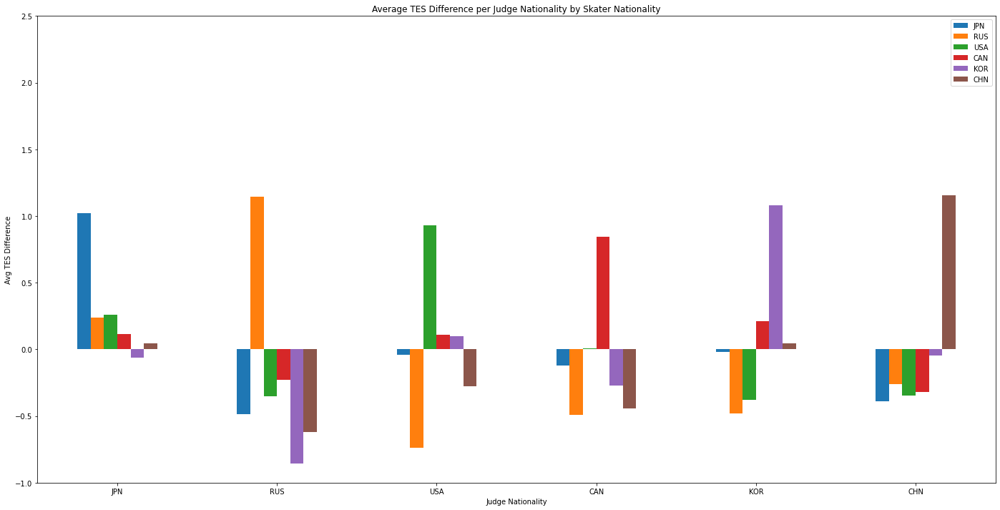

In [256]:
(df_avg_tes_nat.loc[top_nations].plot.bar(rot=0, 
                                          figsize=(24, 12), 
                                          ylim=(-1, 2.5),
                                          title="Average TES Difference per Judge Nationality by Skater Nationality")
.set(xlabel="Judge Nationality", ylabel="Avg TES Difference"))

[Text(0, 0.5, 'Avg PCS Difference'), Text(0.5, 0, 'Judge Nationality')]

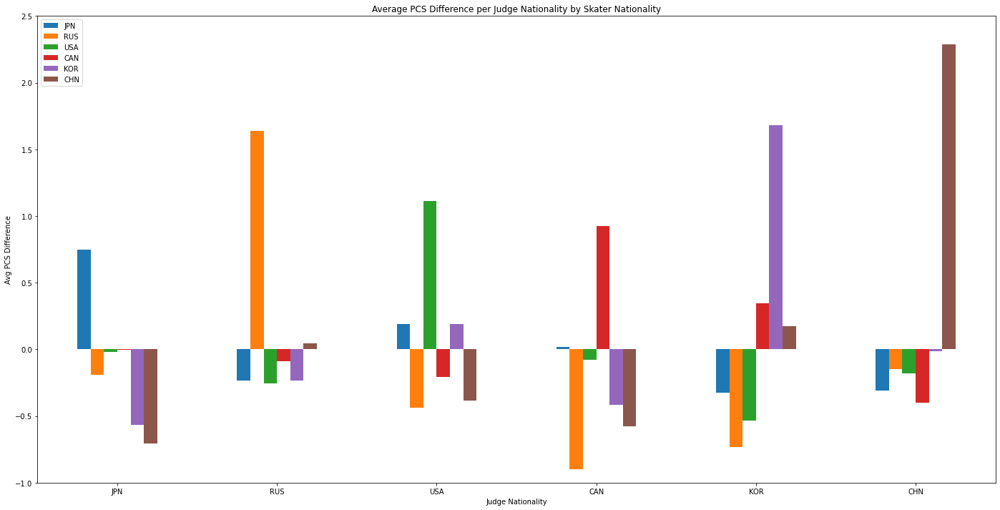

In [257]:
avg_pcs_nat = df_single_judge.groupby(["skater_nat", "judge_nat"])["judge_pcs_diff"].mean()

df_avg_pcs_nat = avg_pcs_nat["JPN"].to_frame()
df_avg_pcs_nat.rename(columns={"judge_pcs_diff" : "JPN"}, inplace=True)

for nat in ["RUS", "USA", "CAN", "KOR", "CHN"]:
  df_avg_pcs_nat[nat] = avg_pcs_nat[nat]

df_avg_pcs_nat.dropna(inplace=True)
(df_avg_pcs_nat.loc[top_nations].plot.bar(rot=0, 
                                          figsize=(24, 12), 
                                          ylim=(-1, 2.5),
                                          title="Average PCS Difference per Judge Nationality by Skater Nationality")
.set(xlabel="Judge Nationality", ylabel="Avg PCS Difference"))

It appears that all of the top skating nations judge their own nation's skaters with higher average TES / PCS scores, possibly indicating a slight bias for their own skaters.

Other interesting trends include Russia and China consistently having lower average TES / PCS scores for all of the other top skating nations, Canada's and the USA's negative TES / PCS scores for Russian skaters, and Japan slight negative scores for Korea.

# Exploring Element Trends

It is no question that technical elements, especially jumps, are the stars of the singles disciplines ofr figure skating, as they are the most technically challenging, visually appealing, and are worth a significant portion of scores. Messing up a jump is the most costly thing point-wise a skater can do, and with the onslaught of more difficult jumps being executed, are often risky.

## Number of Types of Jumps and Errors Executed over Time

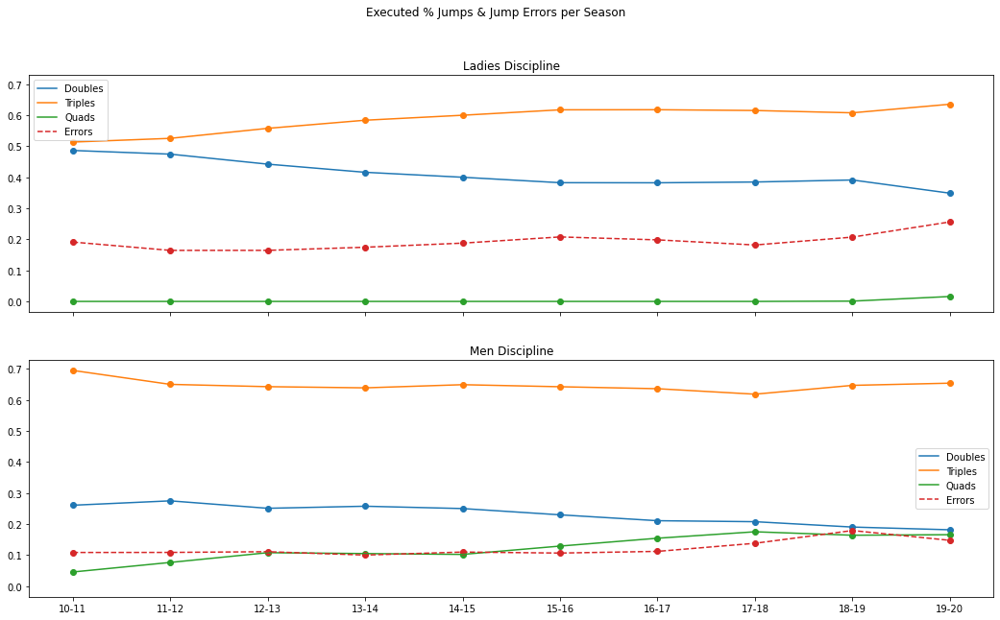

In [258]:
ladies_total_jumps = df_skaters_ladies.groupby(["season"])["num_jumps"].sum()
men_total_jumps = df_skaters_men.groupby(["season"])["num_jumps"].sum()
jump_cols = ["num_doubles", "num_triples", "num_quads", "num_jump_errors"]
ladies_jumps = []
men_jumps = []

for col in jump_cols:
  ladies_jumps.append((df_skaters_ladies.groupby(["season"])[col].sum() / ladies_total_jumps).to_frame().reset_index())
  men_jumps.append((df_skaters_men.groupby(["season"])[col].sum() / men_total_jumps).to_frame().reset_index())

labels = ["Doubles", "Triples", "Quads", "Errors"]

fig, axs = plt.subplots(2, 1, figsize=(18, 10), sharex=True, sharey=True)
for i in range(0, len(labels)):
  if i == 3:
    axs[0].scatter(x=ladies_jumps[i]["season"], y=ladies_jumps[i][0])
    axs[0].plot(ladies_jumps[i]["season"], ladies_jumps[i][0], '--', label=labels[i])
    axs[1].scatter(x=men_jumps[i]["season"], y=men_jumps[i][0])
    axs[1].plot(men_jumps[i]["season"], men_jumps[i][0], '--', label=labels[i])
  else:
    axs[0].scatter(x=ladies_jumps[i]["season"], y=ladies_jumps[i][0])
    axs[0].plot(ladies_jumps[i]["season"], ladies_jumps[i][0], label=labels[i])
    axs[1].scatter(x=men_jumps[i]["season"], y=men_jumps[i][0])
    axs[1].plot(men_jumps[i]["season"], men_jumps[i][0], label=labels[i])

axs[0].legend()
axs[0].set_title('Ladies Discipline')
axs[1].legend()
axs[1].set_title('Men Discipline')
fig.suptitle('Executed % Jumps & Jump Errors per Season')

plt.show()

For Men, the quad revolution begins around the 2015-2016 season, where skaters begin landing jumps like the quadruple flip and quadruple lutz. From then on, more have attempted quadruple jumps, and as the percentage of quad jumps increase, it appears that the percentage of jump errors increase as well.

For Ladies, the first quadruple jumps were landed in the 2018-2019 season and have only multiplied in the current 2019-2020 season. It looks like that the percentage of jump errors are increasing in a way similar to the increase of errors during the beginning of the Men's quad revolution.

## Most Reliable Jumps

Given the type of jump, what proportion has an error? 

Note that errors for this section do not count falls, step outs, and failed attempts, since the num_jump_errors field only counts errors denoted with special characters (underrotations, edge calls, downgrades, invalids).

For reference, the order of jumps from most to least difficult according to ISU (International Skating Union) standards are:
*   Axel (A)
*   Lutz (Lz)
*   Flip (F)
*   Loop (Lo)
*   Salchow (S)
*   Toe (T)

By virtue of difficulty, this is also the order of jumps with the most to least BV.







In [0]:
df_jumps = df_jumps.dropna()
df_jumps["has_error"] = df_jumps["num_jump_errors"] > 0

In [0]:
# Look at single jumps
df_jump_singles = df_jumps[(~df_jumps.element.str.contains("+", regex=False))]
df_jump_singles.reset_index(inplace=True, drop=True)
# Split into men and ladies jumps
df_jumps_singles_men = df_jump_singles[df_jump_singles.event.str.contains("MEN")]
df_jumps_singles_ladies = df_jump_singles[df_jump_singles.event.str.contains("LADIES")]

[Text(0.5, 0, 'Jump Type')]

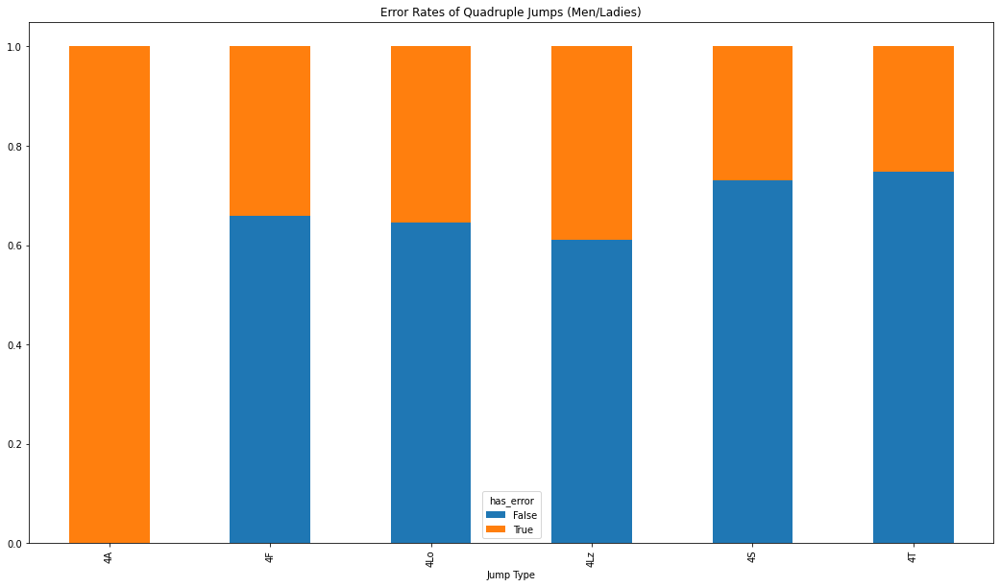

In [267]:
df_quad_jumps = df_jump_singles[df_jump_singles.element.str.contains("4")]
quad_joint = pd.crosstab(df_quad_jumps["has_error"],
                         df_quad_jumps["element"],
                         normalize=True)
quad_cond = quad_joint.divide(quad_joint.sum(axis=0), axis=1)
(quad_cond.T.plot.bar(stacked=True,
                     title="Error Rates of Quadruple Jumps (Men/Ladies)")
.set(xlabel="Jump Type"))

Barring the quad axel (4A), which was only attempted by one skater so far, it seems like that skaters struggle with the quad lutz (4Lz) most. Quad toes (4T) and quad salchow (4S) are more succesful, like due to how easier they are to execute.

[Text(0.5, 0, 'Jump Type')]

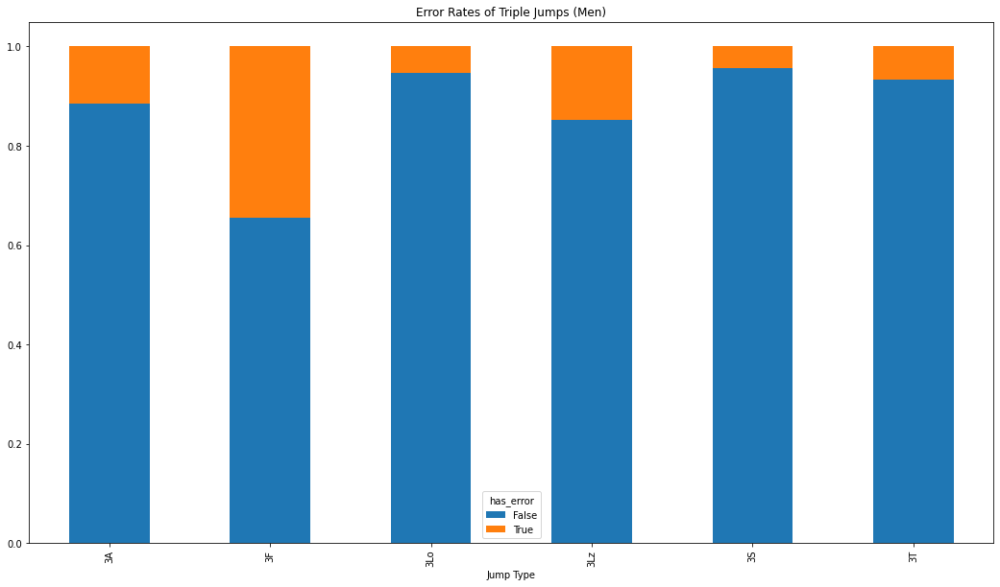

In [268]:
df_triple_jumps = df_jumps_singles_men[df_jumps_singles_men.element.str.contains("3")]
triple_joint = pd.crosstab(df_triple_jumps["has_error"],
                         df_triple_jumps["element"],
                         normalize=True)
triple_cond = triple_joint.divide(triple_joint.sum(axis=0), axis=1)
(triple_cond.T.plot.bar(stacked=True,
                     title="Error Rates of Triple Jumps (Men)")
.set(xlabel="Jump Type"))

[Text(0.5, 0, 'Jump Type')]

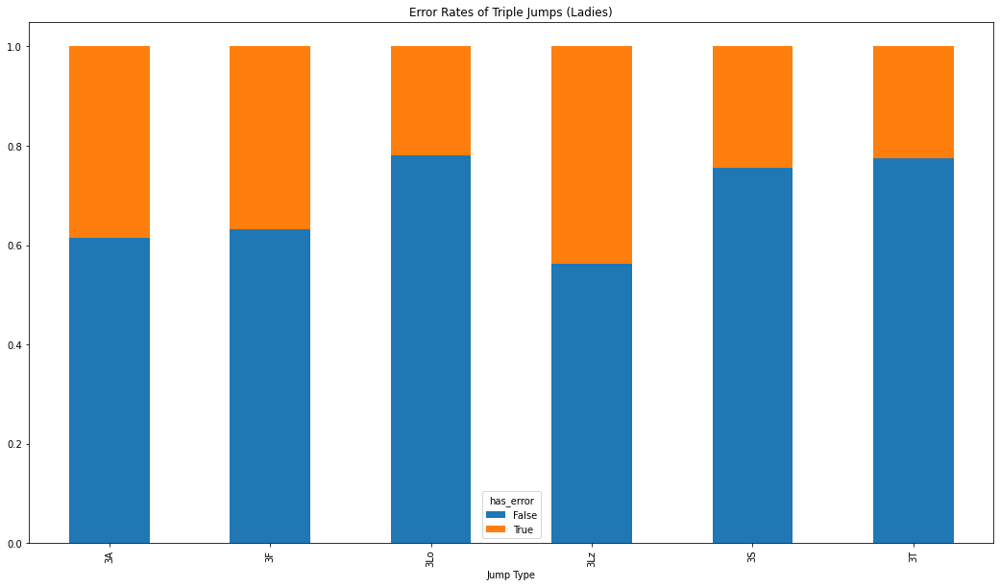

In [270]:
df_triple_jumps = df_jumps_singles_ladies[df_jumps_singles_ladies.element.str.contains("3")]
triple_joint = pd.crosstab(df_triple_jumps["has_error"],
                         df_triple_jumps["element"],
                         normalize=True)
triple_cond = triple_joint.divide(triple_joint.sum(axis=0), axis=1)
(triple_cond.T.plot.bar(stacked=True,
                     title="Error Rates of Triple Jumps (Ladies)")
.set(xlabel="Jump Type"))

It appears that Men tend to struggle with the triple flip (3F) the most, while Ladies tend to struggle with the triple lutz (3Lz) the most.

## Most Successful Program Component

Lastly, I was curious about which program component skaters tend to do better on.

Note that this uses the averages of raw PCS values per skater, meaning that it does not take into the scaling differences of PCS between the Men and Ladies disciplines into account. This is why the Ladies average score are lower that Men's for all components.

[Text(0.5, 0, 'Program Component')]

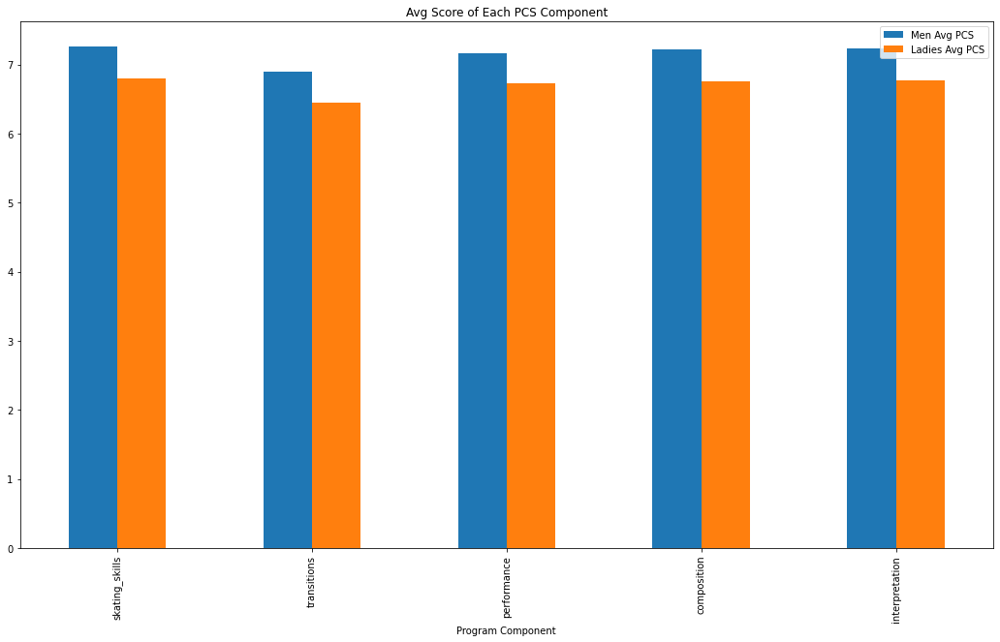

In [271]:
df_pcs_men = df_pcs.loc[df_pcs.event.str.contains("MEN")]
df_pcs_ladies = df_pcs.loc[df_pcs.event.str.contains("LADIES")]
pcs_elems = ["skating_skills", "transitions", "performance", "composition", "interpretation"]
temp = {}

for elem in pcs_elems:
  temp[elem] = [df_pcs_men[elem].mean(), df_pcs_ladies[elem].mean()]

df_pcs_avg = pd.DataFrame(temp, index=["Men Avg PCS", "Ladies Avg PCS"])
(df_pcs_avg.T.plot.bar(title="Avg Score of Each PCS Component")
.set(xlabel="Program Component"))

It appears that the average scores of each program component are nearly identical to each other for both disciplines. However, it appears that Transitions is the worst program component for both male and female skaters.